# XAI for EarthExtremes using `earthnet-models-pytorch`

Initialize notebook, load libraries, etc.

In [1]:
#Autoreload .py files
%load_ext autoreload
%autoreload 2

#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

#https://github.com/Lightning-AI/lightning/issues/15254
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "0"

IMPORTANT: This notebook needs to run in a different environment with the [`earthnet_models_pytorch` requirements](https://github.com/earthnet2021/earthnet-models-pytorch/tree/melanie-de) dependencies + some dependencies for the XAI code:
```{bash}
#Create emp environment
mamba create -n emp
mamba activate emp

#Install earthnet_models_pytorch's appropriate branch
pip install git+https://github.com/earthnet2021/earthnet-models-pytorch/tree/melanie-de.git

#Install requirements for running this notebook
pip install lovely-tensors opencv-python
mamba install captum
pip install git+https://github.com/OscarPellicer/txyvis.git
```


Addtionally, you will need a model checkpoint (you set the path in the notebook's variable `checkpoint_path`), as well as the EartheExtremes collection, but interpolated in the context period, which can be obtained from a standard EarthExtremes distribution by running `earthnet-models-pytorch`'s `scripts/preprocessing/de23_add_interpolation.py` on the datasest. Please, contact `earthnet-models-pytorch`'s library creators for more information in these regards.

In [2]:
import numpy as np
import pandas as pd
import os, sys, yaml
from pathlib import Path
from pprint import pprint
from datetime import datetime
from lovely_numpy import lo
from lovely_tensors import monkey_patch
monkey_patch()
import torch

/home/oscar/.conda/envs/emp/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
#Load custom libs
sys.path.append('/home/oscar/DeepExtremesXAI/')
from lib.XAI import XAI, attribute

Setup paths and config

In [4]:
settings_path='/home/oscar/earthnet-models-pytorch/configs/de23/convlstm_ae/lr_1e-4_iid_1.yaml'
checkpoint_path= '/home/oscar/earthnet-models-pytorch/weights/config_lr_1e-4_iid_1/last.ckpt'
# deepextremes_path= '/scratch/users/deepextremes/deepextremes-minicubes/'
deepextremes_path= '/home/oscar/earthnet-models-pytorch/'
biomes_path= '/home/oscar/earthnet-models-pytorch/mc_earthnet_biome.csv'
save_path= '/home/oscar/txyXAI/experiments/emp_xai'
Path(save_path).mkdir(parents=True, exist_ok=True)
subset= 'fit' #[fit, val, test]
track= 'iid' #[iid, temporal, continent]
#pred_path= 

Load model and dataloader

In [5]:
#Copied from test.py
from argparse import ArgumentParser
from earthnet_models_pytorch.model import MODELS
from earthnet_models_pytorch.data import DATASETS
from earthnet_models_pytorch.task import SpatioTemporalTask
from earthnet_models_pytorch.utils import parse_setting

#Parse settings
setting_dict = parse_setting(settings_path, track=track)
setting_dict['Data']['base_dir']= deepextremes_path
setting_dict['Data']['fold_path']= biomes_path
#setting_dict["Task"]["pred_dir"]= pred_path

# Data
data_args = ["--{}={}".format(key, value) for key, value in setting_dict["Data"].items()]
data_parser = ArgumentParser()
data_parser = DATASETS[setting_dict["Setting"]].add_data_specific_args(data_parser)
data_params = data_parser.parse_args(data_args)
dm = DATASETS[setting_dict["Setting"]](data_params)

# Model
model_args = ["--{}={}".format(key, value) for key, value in setting_dict["Model"].items()]
model_parser = ArgumentParser()
model_parser = MODELS[setting_dict["Architecture"]].add_model_specific_args(model_parser)
model_params = model_parser.parse_args(model_args)
model = MODELS[setting_dict["Architecture"]](model_params)

# Task
task_args = ["--{}={}".format(key, value) for key, value in setting_dict["Task"].items()]
task_parser = ArgumentParser()
task_parser = SpatioTemporalTask.add_task_specific_args(task_parser)
task_params = task_parser.parse_args(task_args)
task = SpatioTemporalTask(model=model, hparams=task_params)

# Checkponit
task.load_from_checkpoint(
    checkpoint_path=checkpoint_path,
    context_length=setting_dict["Task"]["context_length"],
    target_length=setting_dict["Task"]["target_length"],
    model=model,
    hparams=task_params)

# # Trainer
# trainer_dict = setting_dict["Trainer"]
# trainer_dict["logger"] = False
# trainer = pl.Trainer(callbacks=TQDMProgressBar(refresh_rate=10), **trainer_dict)

learning rate 0.0004
Using Masked L2 NDVI Loss.
Using Masked RootMeanSquaredError metric Loss.
Using Masked L2 NDVI Loss.
Using Masked RootMeanSquaredError metric Loss.


SpatioTemporalTask(
  (model): ConvLSTMAE(
    (encoder_1_convlstm): ConvLSTMCell(
      (conv): Conv2d(97, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (encoder_2_convlstm): ConvLSTMCell(
      (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (decoder_1_convlstm): ConvLSTMCell(
      (conv): Conv2d(90, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (decoder_2_convlstm): ConvLSTMCell(
      (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (conv): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (activation_output): Sigmoid()
  )
  (loss): MaskedPixelwiseLoss()
  (metric): RootMeanSquaredError()
)

First of all, we need to ovewrite the `forward` method in the model such that it only takes some tensors as input, and returns a tensor as output. 

We should do this in the code, but we are doing it here instead so as to not overwrite any code in the library since this change would break the rest of the library. 

In [6]:
task.model.__class__

earthnet_models_pytorch.model.convlstm_ae.ConvLSTMAE

In [7]:
#Assign the current forward method to _forward() if it was not already assigned
if task.model.forward.__doc__.startswith('[patched]'):
    print('model.forward method is already patched')
else:
    task.model._forward= task.model.forward

    #Now define a new forward method that just takes tensors as inputs and returs a tensor as output
    #Also, output classes need to always be in position 1 so, we do the swap back and forth
    #Finally, tensors that do not intervine in forward should not be passed, or XAI will complain and fail
    def forward(self, dynamic_era5, static, dynamic_s2): #t, xy, txy #dynamic_mask, landcover
        '[patched] Takes tensors as inputs and returs a tensor as output'
        data_repacked= {'dynamic': [dynamic_s2.swapaxes(1,2), dynamic_era5.swapaxes(1,2)], 
                        # 'dynamic_mask': [dynamic_mask.swapaxes(1,2)], 
                        'static': [static], 
                        # 'landcover': landcover.swapaxes(1,2), 
                        'global_step': 0}
        preds, aux= self._forward(data_repacked, pred_start=task.context_length, preds_length=task.target_length)
        return preds.swapaxes(1,2)

    # task.model.forward= forward
    task.model.forward = forward.__get__(task.model, task.model.__class__)

#Check that our forward method has been correctly added
print(task.model.forward.__doc__)

[patched] Takes tensors as inputs and returs a tensor as output


Let's get the dataset

In [8]:
#We get the dataloader that we will use
print(subset)
dm.setup(subset if 'sbuset' != 'val' else 'fit')
dataset= eval({'fit':'dm.earthnet_train', 'val':'dm.earthnet_val', 'test':'dm.earthnet_test'}[subset])

fit


/home/oscar/earthnet-models-pytorch/earthnet_models_pytorch/data/de23_data.py:463: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(self.hparams.fold_path, delimiter=",")[


In [9]:
len(dataset)

88659

Unfortunately, we only have two cubes available. Let's configure the dataset to only use those cubes

In [10]:
available_cubes= ['mc_13.37_49.09_1.1_20230611_0.zarr', 'mc_-44.98_-10.49_1.1_20230611_0.zarr']
metadata= [d for d in dataset.metadata if d[0].name in available_cubes]
dataset.metadata= metadata
metadata

[(Path('/home/oscar/earthnet-models-pytorch/full/1.1/mc_-44.98_-10.49_1.1_20230611_0.zarr'),
  Timestamp('2017-09-04 12:00:00'),
  Timestamp('2018-11-27 12:00:00')),
 (Path('/home/oscar/earthnet-models-pytorch/full/1.1/mc_-44.98_-10.49_1.1_20230611_0.zarr'),
  Timestamp('2018-11-28 12:00:00'),
  Timestamp('2020-02-20 12:00:00')),
 (Path('/home/oscar/earthnet-models-pytorch/full/1.1/mc_-44.98_-10.49_1.1_20230611_0.zarr'),
  Timestamp('2020-02-21 12:00:00'),
  Timestamp('2021-05-15 12:00:00')),
 (Path('/home/oscar/earthnet-models-pytorch/full/1.1/mc_13.37_49.09_1.1_20230611_0.zarr'),
  Timestamp('2017-12-03 12:00:00'),
  Timestamp('2019-02-25 12:00:00')),
 (Path('/home/oscar/earthnet-models-pytorch/full/1.1/mc_13.37_49.09_1.1_20230611_0.zarr'),
  Timestamp('2019-02-26 12:00:00'),
  Timestamp('2020-05-20 12:00:00')),
 (Path('/home/oscar/earthnet-models-pytorch/full/1.1/mc_13.37_49.09_1.1_20230611_0.zarr'),
  Timestamp('2020-05-21 12:00:00'),
  Timestamp('2021-08-13 12:00:00'))]

In [11]:
# import xarray as xr
# cube= xr.open_dataset(metadata[-1][0], engine='zarr')
# np.unique(cube.event_labels.values)

In [12]:
data0= dataset[0]
pprint(data0)

{'cubename': 'mc_-44.98_-10.49_2017-09-04',
 'dynamic': [tensor[90, 8, 128, 128] n=11796480 (45Mb) x∈[-0.054, 0.913] μ=0.226 σ=0.201,
             tensor[90, 24] n=2160 (8.4Kb) x∈[-1.128e-06, 0.983] μ=0.529 σ=0.361],
 'dynamic_mask': [tensor[90, 1, 128, 128] n=1474560 (5.6Mb) x∈[0., 1.000] μ=0.339 σ=0.473],
 'filepath': '/home/oscar/earthnet-models-pytorch/full/1.1/mc_-44.98_-10.49_1.1_20230611_0.zarr',
 'landcover': tensor[90, 1, 128, 128] n=1474560 (5.6Mb) x∈[0., 10.000] μ=4.525 σ=2.982,
 'landcover_mask': tensor[90, 1, 128, 128] bool n=1474560 (1.4Mb) x∈[False, True] μ=0.468 σ=0.499,
 'static': [tensor[1, 128, 128] n=16384 (64Kb) x∈[0.208, 0.225] μ=0.218 σ=0.003]}


And let's check that everything still runs

In [13]:
#Note that we need to add the batch dimension to the inputs
preds0= task.model(data0['dynamic'][1][None].swapaxes(1,2), 
                   # data0['dynamic_mask'][0][None].swapaxes(1,2), 
                   data0['static'][0][None], 
                   # data0['landcover'][None].swapaxes(1,2)
                   data0['dynamic'][0][None].swapaxes(1,2)
                  )
pprint(preds0)

tensor[1, 1, 17, 128, 128] n=278528 (1.1Mb) x∈[0.385, 0.792] μ=0.578 σ=0.079 grad TransposeBackward0


Create a config file for the XAI 

In [14]:
#We need a flat list of feature names in the same order as they appear in a batch
from earthnet_models_pytorch.data.de23_data import variables as v
from earthnet_models_pytorch.data.de23_data import DeepExtremes2023Dataset
feature_names_flat= v['era5'] + ['topography'] + ['NDVI'] + v['s2_bands'] 

In [15]:
#Most settings required by XAI are in config['xai']
#But some are in other dictionaries. Let's set them:
config= {}
config['data']= {}
config['task']= 'regression'
config['data']['input_features_flat']= feature_names_flat
config['data']['output_classes']= ['NDVI'] 
config['save_path']= save_path

#Create xai configuration dictionary
config['xai']={}
#If debug is set to > 0, XAI will print some extra information when running, and will only run 1 sample
config['debug']= False

#Here we can choose the attribution mode. For this example, only 'custom' and 'custom-full' will be used.
#Here is the whole list: ["none", "events[-full]", "correctness[-full]", "labels[-full]", "custom[-full]"]
# If 'custom', we need to provide an aggregation mask for every output channel. This mask will contain the
# output pixels over which the attribution will take place.
# If 'custom-full', we need to provide any number of attribution masks (one on a different channel). 
# This mask will contain the output pixels over which the attribution will take place. As comparted with
# 'custom' with 'custom-full', all combinations of output channel and aggregation mask will be computed
#Later on, we will see that this configuration will be overwritten depending on attribution experiment that
#we are performing
config['xai']['mask']= 'custom'

#Select xai method. Any from Captum, such as IntegratedGradients, InputXGradient, GradientShap, etc.
config['xai']['type']= 'IntegratedGradients'
#Extra parameters to pass to XAI method. Chooose internal_batch_size=1 of running out of memory
config['xai']['params']= {'n_steps':8, 'internal_batch_size':1} 

#Define RGB bands for plotting and attribution averaging.
#This only applies if the input or output channels are RGB, by setting here the name of the RGB bands
#the plotting can print them as RGB
config['xai']['in_channels_rgb_2d']= []
config['xai']['out_channels_rgb_2d']= [] 
config['xai']['in_channels_rgb_3d']= ['B04', 'B03', 'B02']
config['xai']['out_channels_rgb_3d']= []

#Choose percentage of attributions that get clipped out (does not affect nd plots or global attrs.)
config['xai']['outlier_percentage']= 1.

#Choose what plots to compute. We will only generate plots if they are activated here.
#Although these vales will be later redefined depending on the experiment
# - For local (cube-wise) attributions, we can plot: ['nd', '1d', '2d', '3d'], depending on the dim of the inputs
# - For global (average) attributions, we can plot: ['avg', 'dim-reduction', 'cluster']
config['xai']['plots']= ['avg', 'nd', '1d', '2d', '3d']

#Perform (if >1) structured downsampling of the data for global attribution
#This simply reduces the amount of pixels to consider to avoid running OOM
config['xai']['global_downsampling']= 4

#If true, rescales attribs. so that only non-zero inputs are considered 
#This is because 0 usually means that the input was not available
#However, this option can be wrong in many cases, so use with caution
config['xai']['non_zero_standarization']= True

#Ignore some output features / classes for attribution. If non-empty, we will not attribute wrt some classes,
#instead their attributions will just be filled with nans (improves efficiency, but NOT RAM footprint)
config['xai']['ignore_classes']= [] #Leave only (k)NDVI

#Clustering config. 
#One of https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html
config['xai']['clustering']= {}
config['xai']['clustering']['method']= 'KMeans' 
config['xai']['clustering']['params']= {'n_clusters':5, 'init':'k-means++', 
                                         'max_iter':300, 'random_state':42}
config['xai']['clustering']['plot_prototypes']= 3

#Dimensionality reduction config
config['xai']['dim-reduction']= {}
config['xai']['dim-reduction']['method']= 'PCA' 
config['xai']['dim-reduction']['params']= {} 

#We may want to reduce some dimensions in the input, not only the output
#We have to select the input axes over which we want to aggregate for every input tensor
#as well as the aggregation function
#For now, we disable it by setting it to None, but in the experiments we will use it
config['xai']['agg_inputs']= None
config['xai']['agg_inputs_function']= 'mean' #'mean', 'min', 'max', 'minmax'

#Ignore some input classes for the purposes of plotting (the attributions must be computed anyway)
config['xai']['keep_input_features']= None

Create a custom dataloader wrapping around the actual one, that feeds the data to the XAI modules as it expects it.

In [16]:
#We always have 3 minicubes associated with a single ID, so we must choose which of the 3 we consider
# - 0 2017-12-03 12:00:00 -> 2019-02-25 12:00:00
# - 1 2019-02-26 12:00:00 -> 2020-05-20 12:00:00
# - 2 2020-05-21 12:00:00 -> 2021-08-13 12:00:00
import datetime
start_date= datetime.datetime.strptime('21/05/2020 12:00', '%d/%m/%Y %H:%M')

In [17]:
from lib.XAI_deepextremes_loader import DeepExtremesXAILoader, empty_cache
from copy import copy
empty_cache()
device= task.device

class XAIDataset(DeepExtremesXAILoader):
    def __init__(self, dataset, config, cubes, timesteps, device, start_date, history=None, 
                 N=100, subset='all', event_duration=None, debug=False, 
                 keep_classes=['grassland', 'broadtree', 'needletree', 'mixedtree'],
                 **kwargs):
        #We need to set up some class attributes
        #Set dataset
        self.dataset= dataset
        
        #Set registry as a dataframe with index=['mc_id'], 
        #and columns= ['path', 'start', 'end', 'class', 'event']
        if cubes in ['val_landcover_random']:
            raise NotImplementedError('TODO: add landcover class column to registry')
        if isinstance(cubes, int):
            raise NotImplementedError('TODO: add event column to registry')
        self.registry= pd.DataFrame(self.dataset.metadata, columns=['path', 'start', 'end'])
        self.registry['mc_id']= self.registry.path.apply(lambda c: Path(c).stem)
        self.registry= self.registry.loc[self.registry.start==start_date]
        self.registry= self.registry.reset_index().rename({'index':'dataset_index'}, axis=1)
        print(f'Using only cubes with {start_date=}')

        #The rest of the intialization is handled by the parent class
        super().__init__(dataset, config, cubes, timesteps, device,
             history=history, N=N, subset=subset, event_duration=event_duration, **kwargs)
        
        #We reset index and drop the index var
        self.registry= self.registry.reset_index().drop('index', axis=1)
        
    def swap_axes(self, *arrs, ax1=1, ax2=2, condition= lambda _: True):
        return tuple(a.swapaxes(ax1, ax2) if condition(a) else a for a in arrs)
        
    def _get_data(self, cid):
        #Get and process batch (in reality, a single element is returned)
        if isinstance(cid, str): 
            cid_true= copy(cid)
            cid= self.registry[self.registry.mc_id == cid | self.registry.path == cid].dataset_index
        else:
            cid_true= self.registry.iloc[cid].mc_id
            cid= self.registry.iloc[cid].dataset_index
        batch= self.dataset[cid]
        
        NDVI_s2_bands= batch['dynamic'][0].to(self.device) #[90, 8, 128, 128], 
        era5= batch['dynamic'][1].to(self.device) #[90, 24]
        cloud_mask= batch['dynamic_mask'][0].to(self.device) #[90, 1, 128, 128]
        topography= batch['static'][0].to(self.device) #[1, 128, 128]
        # s2_scene_classification= batch['landcover'].to(self.device) #[90, 1, 128, 128]
        # lc_mask= batch['landcover_mask'].to(self.device) #[90, 1, 128, 128] #Unused?

        #Add batch dimension
        #TODO: Check if we need to invert masks
        #Last 17 timesteps are the GT + keep only NDVI
        masks= cloud_mask[-17:, [0]][None]
        labels= NDVI_s2_bands[-17:, [0]][None] 

        #Input stuff. Not using cloud_mask, s2_scene_classification
        #Very important!! We set the order to be t, xy, txy
        #This just hast to agree with the convention used by forward(), whatever it is
        final_batch= {}
        final_batch['x']= tuple([xi[None] for xi in [era5, topography, NDVI_s2_bands]]) 

        #We will now swap axis 1 <> 2 to follow the same criterion
        condition= lambda a: a.shape[1] == 90 #Do not swap topography
        final_batch['x']= self.swap_axes(*final_batch['x'], condition=condition)
        masks, labels= self.swap_axes(masks, labels)
        
        #TODO
        event_labels= None
        
        return final_batch, labels, masks, cid_true, event_labels

    def _postprocess_data(self, final_batch, timestep=None):        
        #We will now swap axis 1 <> 2 to follow the same criterion
        # final_batch['x']= self.swap_axes(*final_batch['x'], condition=condition)
        # final_batch['masks'], final_batch['agg_mask'], final_batch['labels']=\
        #  self.swap_axes(final_batch['masks'], final_batch['agg_mask'], final_batch['labels'])
        
        #TODO: Implement history mechanism to reduce memory footprint
        if self.history is not None:
            pass
        
        return final_batch

#Test XAIDataset
DEXAI= XAIDataset(dataset, config, ['mc_13.37_49.09_1.1_20230611_0'], [5], device, start_date, 
                  history=None, subset='test', debug=False, debug_on_error=True)
pprint(DEXAI[0])

Using only cubes with start_date=datetime.datetime(2020, 5, 21, 12, 0)
Cannot filter out classes not in keep_classes=None because registry does not have class column
Explaining 1 cubes
{'agg_mask': tensor[1, 1, 17, 128, 128] n=278528 (1.1Mb) x∈[0., 1.000] μ=0.059 σ=0.235,
 'event_name': ['mc_13.37_49.09_1.1_20230611_0-timestep=5'],
 'labels': tensor[1, 1, 17, 128, 128] n=278528 (1.1Mb) x∈[-0.280, 0.912] μ=0.229 σ=0.312,
 'masks': tensor[1, 1, 17, 128, 128] n=278528 (1.1Mb) x∈[0., 1.000] μ=0.889 σ=0.314,
 'x': (tensor[1, 24, 90] n=2160 (8.4Kb) x∈[-2.820e-07, 0.994] μ=0.487 σ=0.338,
       tensor[1, 1, 128, 128] n=16384 (64Kb) x∈[0.435, 0.605] μ=0.505 σ=0.036,
       tensor[1, 8, 90, 128, 128] n=11796480 (45Mb) x∈[-0.280, 1.498] μ=0.256 σ=0.296)}


## Experiments

### Experiment 1: Local attributions

Explain a specific timestep of a specific minicube. We need to set a manual list of cubes + timesteps to explain.

In [18]:
#Set up: cube ids + timesteps to explain
test_cubes= ['mc_13.37_49.09_1.1_20230611_0']
test_timesteps= [5]
history= (-74, 10) #How much history to consider for explainability (if high, we will run OOM). None to disable

#Overwrite config
config['xai']['plots']= ['nd', '1d', '2d', '3d'] #Only local attributions
config['xai']['mask']= 'custom'
config['xai']['agg_classes']= [None] #Custom names for the final XAI aggregation classes, or None for default
config['xai']['agg_inputs']= None
DEXAI= XAIDataset(dataset, config, test_cubes, test_timesteps, device, start_date,
                  history=history, subset='test', debug=False)

#Create a XAI instance
xai= XAI(config, task.model, DEXAI)

Using only cubes with start_date=datetime.datetime(2020, 5, 21, 12, 0)
Cannot filter out classes not in keep_classes=None because registry does not have class column
Explaining 1 cubes


In [19]:
#Attribute
empty_cache()
attributions, inputs, labels, predictions, masks, x_shapes, y_shape= attribute(xai.config, xai.model, xai.loader,
   xai.num_classes, xai.out_agg_dim, xai.agg_mode, ignore_classes=xai.ignore_classes, events=None, debug=False)

Explaining Dataloader: [event_name=['mc_13.37_49.09_1.1_20230611_0-timestep=5']]: 100%|██████████| 1/1 [01:10<00:00, 70.51s/it]


Attribution outputs:
- `attributions`: dict (over event ids) of lists of arrays with shape ([out x, out y, out t], out classes, [in x, in y, in t], in features)
- `inputs`: dict (over event ids) of lists of arrays with shape ([in x, in y, in t], in features)
- `labels`: dict (over event ids) of arrays with shape ([out x, out y, out t], [out classes])
- `masks`: dict (over event ids) of arrays with shape ([out x, out y, out t], [out classes])
- `predictions`: dict (over event ids) of arrays with shape ([out x, out y, out t], out classes)

In [20]:
#Let's take a look at the outupts for the first event
for arr, name in zip([attributions, inputs],['attributions', 'inputs']):
    for i, arr_i in enumerate(arr):
        event= next(iter(arr_i.keys()))
        print(f' - {name}[{i}]["{event}"]:\n     {lo(arr_i[event])}')
    print('')
        
for arr, name in zip([labels, masks, predictions],['labels', 'masks', 'predictions']):
    event= next(iter(arr.keys()))
    print(f' - {name}[{i}]["{event}"]:\n     {lo(arr[event])}\n')

 - attributions[0]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[1, 90, 24] n=2160 (17Kb) x∈[-0.014, 0.024] μ=-6.053e-05 σ=0.002
 - attributions[1]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[1, 128, 128, 1] n=16384 (0.1Mb) x∈[-0.000, 0.000] μ=1.160e-07 σ=1.469e-05
 - attributions[2]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[1, 128, 128, 90, 8] n=11796480 (90Mb) x∈[-0.001, 0.000] μ=2.134e-08 σ=1.637e-06

 - inputs[0]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[90, 24] f32 n=2160 (8.4Kb) x∈[-2.820e-07, 0.994] μ=0.487 σ=0.338
 - inputs[1]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[128, 128, 1] f32 n=16384 (64Kb) x∈[0.435, 0.605] μ=0.505 σ=0.036
 - inputs[2]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[128, 128, 90, 8] f32 n=11796480 (45Mb) x∈[-0.280, 1.498] μ=0.256 σ=0.296

 - labels[2]["mc_13.37_49.09_1.1_20230611_0-timestep=5"]:
     array[128, 128, 17, 1] f32 n=278528 (1.1Mb) x∈[-0.280, 0.912] μ=0.229 σ=0.312

 - 

In [ ]:
#Visualize
(attributions_global, inputs_global, labels_global, predictions_global, masks_global, feature_names_global, 
     x_shapes_global, event_names)= xai.xai(data=(attributions, inputs, labels, predictions, masks, x_shapes, y_shape))

agg-custom [IntegratedGradients] [-5.32E-05 - 5.40E-05] [input 2] mc_13.37_49.09_1.1_20230611_0-timestep=5 nd.png


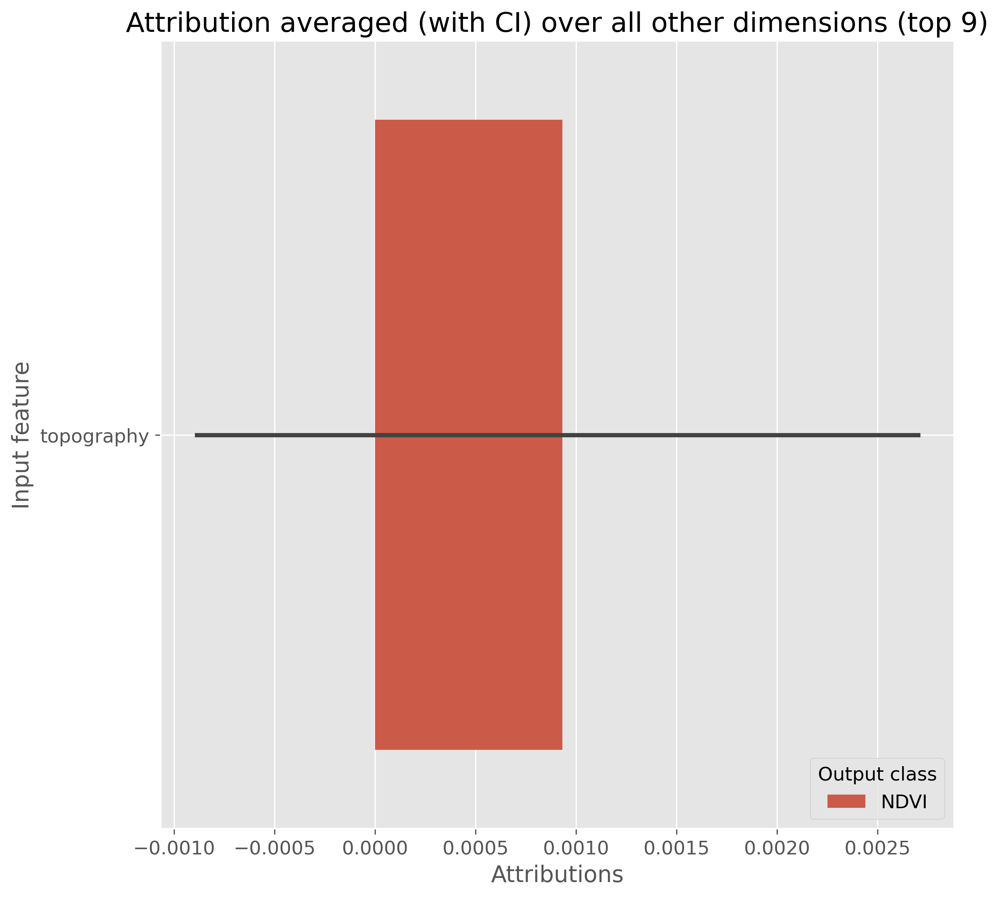

agg-custom [IntegratedGradients] [-5.32E-05 - 5.40E-05] [input 2] mc_13.37_49.09_1.1_20230611_0-timestep=5 2d.png


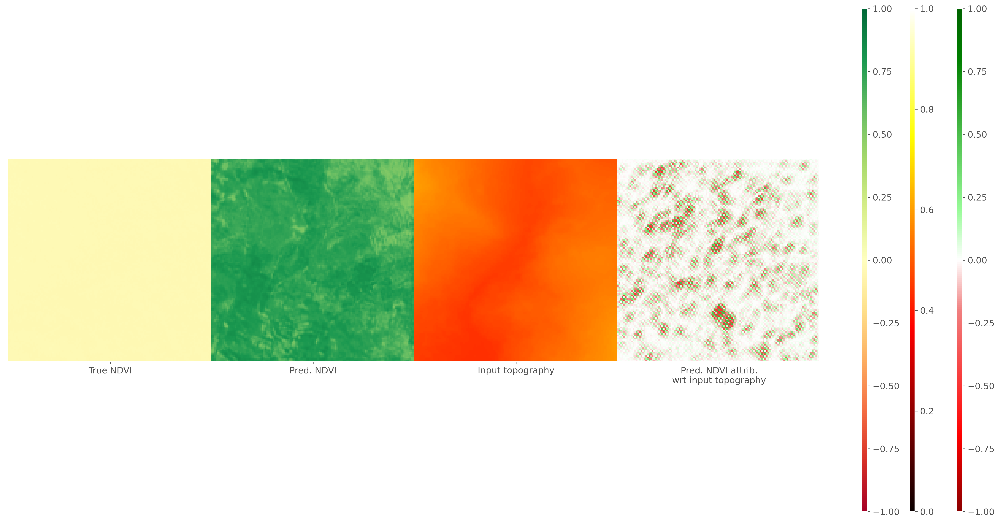

agg-custom [IntegratedGradients] [-2.24E-06 - 2.70E-06] [input 3] mc_13.37_49.09_1.1_20230611_0-timestep=5 nd.png


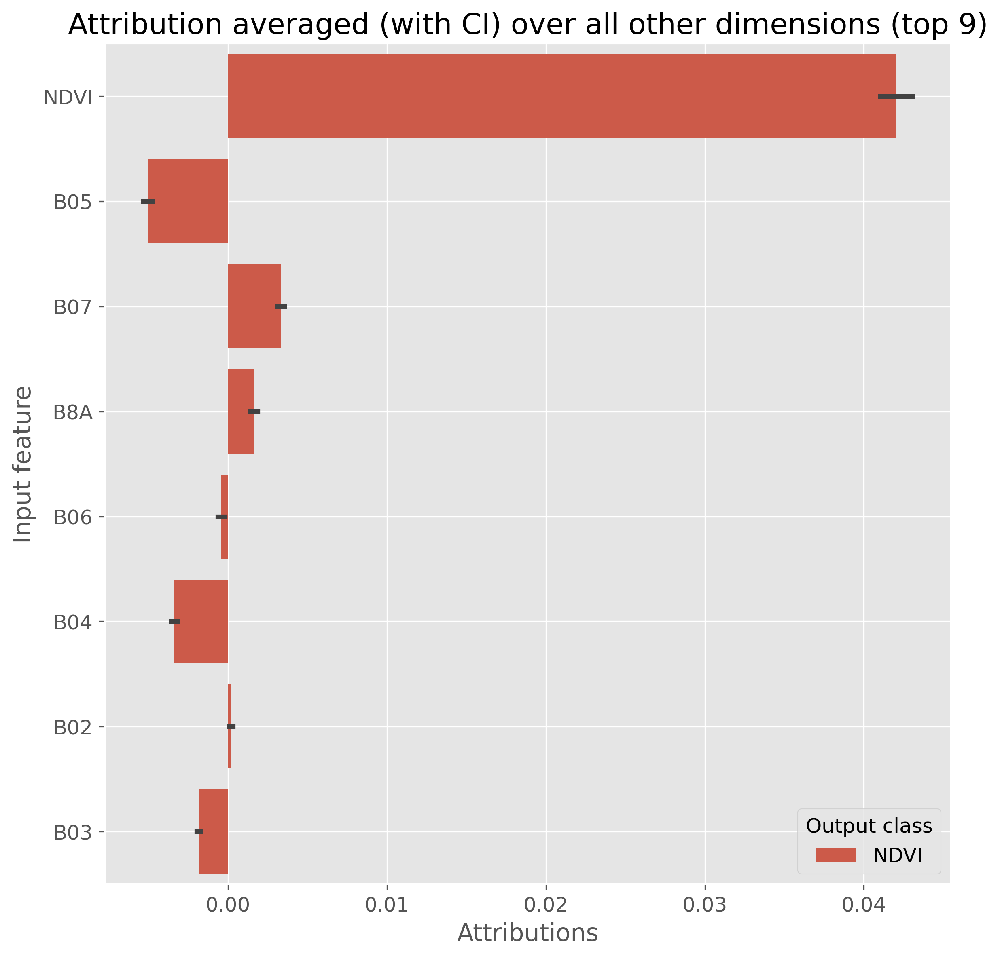

agg-custom [IntegratedGradients] [-2.24E-06 - 2.70E-06] [input 3] mc_13.37_49.09_1.1_20230611_0-timestep=5 3d.png


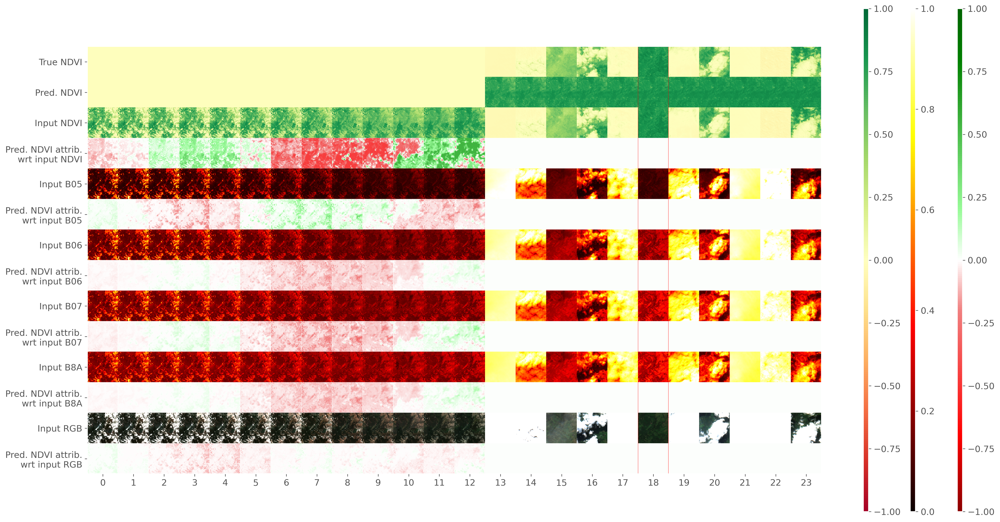

agg-custom [IntegratedGradients] [-9.39E-03 - 8.85E-03] [input 1] mc_13.37_49.09_1.1_20230611_0-timestep=5 nd.png


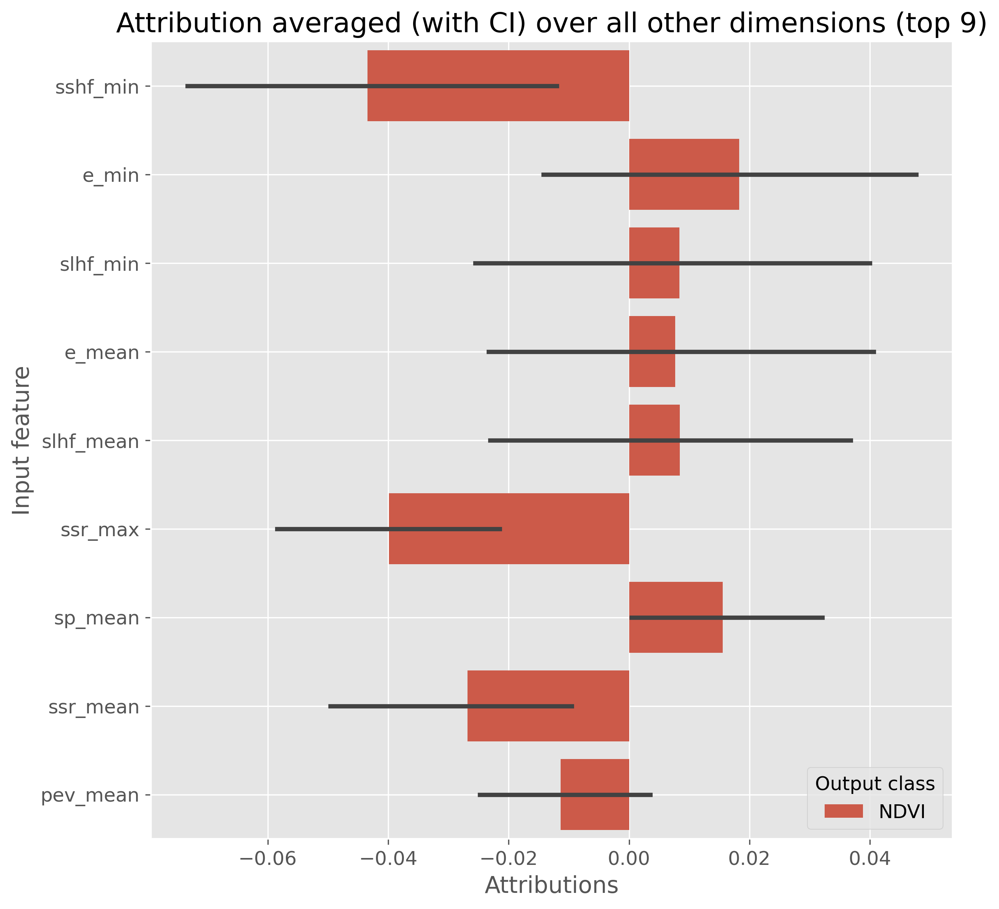

agg-custom [IntegratedGradients] [-9.39E-03 - 8.85E-03] [input 1] mc_13.37_49.09_1.1_20230611_0-timestep=5 1d.png


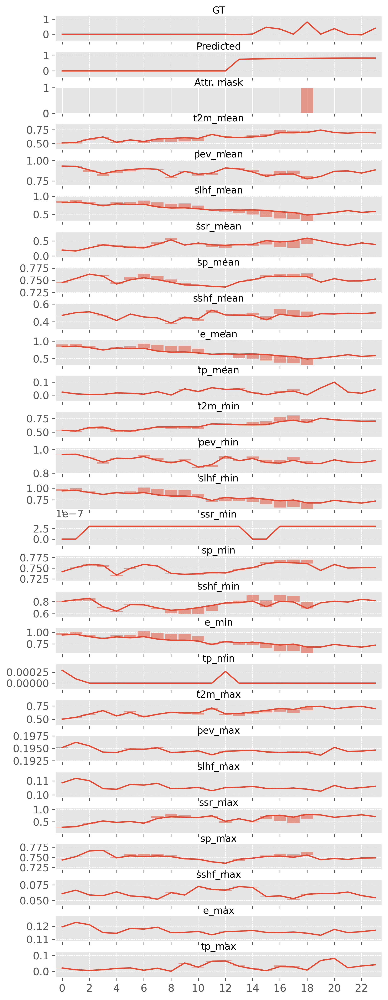

In [22]:
#We now grab the generated images and plot them here
#Double click on the images to see them full size
from IPython.display import Image, display
from pathlib import Path
image_list= list((Path(save_path) / 'xai').glob('*.png'))
for img in image_list: #Limit
    if 'Global' in img.name: continue
    print(img.name)
    display(Image(filename=str(img), alt=str(img)))

If we are getting: `RuntimeError: One of the differentiated Tensors appears to not have been used in the graph.`
This allows us to locate the unused tensor, which will be None. We have to edit forward to only
take as input tensors that are actually being used by the model

```
from torch.autograd import grad as original_grad
def new_grad(*args, **kwargs):
    kwargs['allow_unused'] = True
    return original_grad(*args, **kwargs)

torch.autograd.grad = new_grad
```

### Experiment 2: Global average attributions

Here, we select a random subset of test cubes (N=250), and perform global average attributions over a month of outputs (starting at output position `timestep`)

In [23]:
#Set up
subset= 'test' #'test' or 'val'
timestep= 5
history= (-74, 10)

#Overwrite config
config['xai']['plots']= ['avg', 'dim-reduction', 'cluster']
config['xai']['mask']= 'custom'
config['xai']['agg_classes']= [None]
#Input's shape: ([in x, in y, in t], in features)
config['xai']['agg_inputs']= None #[[], [0,1], [0,1]] #[[0], [0,1], [0,1,2]] 
config['xai']['agg_inputs_function']= 'mean' #'mean', 'min', 'max', 'minmax'

#Explain a random month of predictions for every cube
DEXAI= XAIDataset(dataset, config, f'{subset}_random', timestep, device, start_date, N=250,
                  history=history, subset=subset, debug=False)

#Create a XAI instance
xai= XAI(config, task.model, DEXAI)

Using only cubes with start_date=datetime.datetime(2020, 5, 21, 12, 0)
Cannot filter out classes not in keep_classes=None because registry does not have class column
Explaining 1 cubes


In [ ]:
#Attribute
empty_cache()
attributions, inputs, labels, predictions, masks, x_shapes, y_shape= attribute(xai.config, xai.model, xai.loader,
   xai.num_classes, xai.out_agg_dim, xai.agg_mode, ignore_classes=xai.ignore_classes, events=None, debug=False)

In [ ]:
#Visualize: we here repeat the analysis for a different number of clusters each time
n_clusters= np.array([3])
for nc in n_clusters:
    xai.clustering_params['n_clusters']= nc #We hot-patch the number of clusters
    (attributions_global, inputs_global, labels_global, predictions_global,
      masks_global, feature_names_global, x_shapes_global, event_names
        )= xai.xai(data=(attributions, inputs, labels, predictions, masks, x_shapes, y_shape));

In [ ]:
#We now grab the generated images and plot them here
#Double click on the images to see them full size
from IPython.display import Image, display
from pathlib import Path
image_list= list((Path(save_path) / 'xai').glob('*.png'))
for img in image_list: #Limit
    if 'Global' not in img.name: continue
    print(img.name)
    display(Image(filename=str(img), alt=str(img)))